In [1]:
import pandas as pd
pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 100)
pd.set_option("max_colwidth", 200)

import numpy as np

#from catboost import CatBoostRegressor, Pool
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import RepeatedKFold

import matplotlib.pyplot as plt
import seaborn as sns
import shap
shap.initjs()

In [2]:
ordinal = pd.read_csv('../Data/BaseOrdinal.csv')
ordinal.shape

(2580, 83)

In [3]:
ordinal = ordinal.drop(['Unnamed: 0', 'PID', 'Unnamed: 0.1'], axis=1)
ordinal.shape

(2580, 80)

In [4]:
X = ordinal.drop(['SalePrice'], axis=1)
y = ordinal.SalePrice

In [5]:
GB = GradientBoostingRegressor()

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [7]:
GB.fit(X_train, y_train)

GradientBoostingRegressor()

In [8]:
explainer = shap.TreeExplainer(GB)

In [9]:
shap_values = explainer.shap_values(X)

In [10]:
# visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [13]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X)

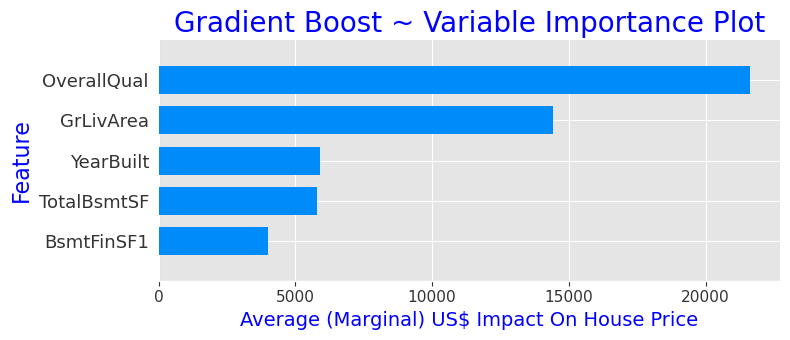

In [29]:
#Variable Importance Plot ~ Global Interpretability

plt.style.use('default')
plt.style.use('ggplot')

plt.figure(figsize=(8,4))

shap.summary_plot(shap_values, X, plot_type='bar', max_display=5, show=False)
#plt.title('Gradient Boost ~ Variable Importance Plot', color='blue', fontsize=20)

plt.ylabel('Feature', fontsize=16, color='blue')
plt.xlabel('Average (Marginal) US$ Impact On House Price', fontsize=14, color='blue')
plt.title('Gradient Boost ~ Variable Importance Plot', fontsize=20, color='blue')


plt.tight_layout()
plt.show();

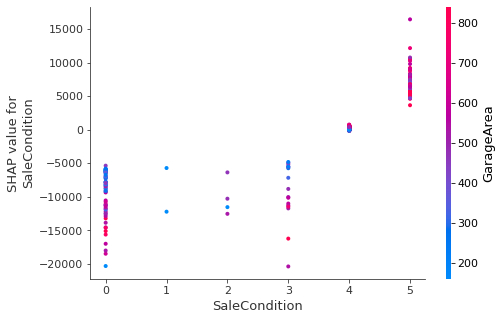

In [14]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("SaleCondition", shap_values, X)

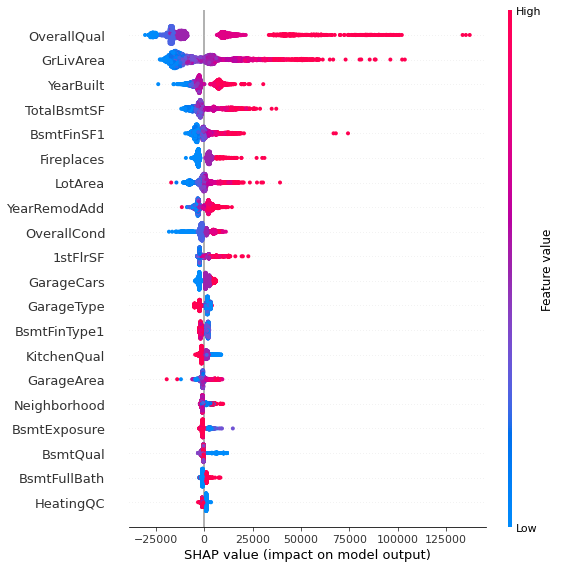

In [15]:
shap.summary_plot(shap_values, X)

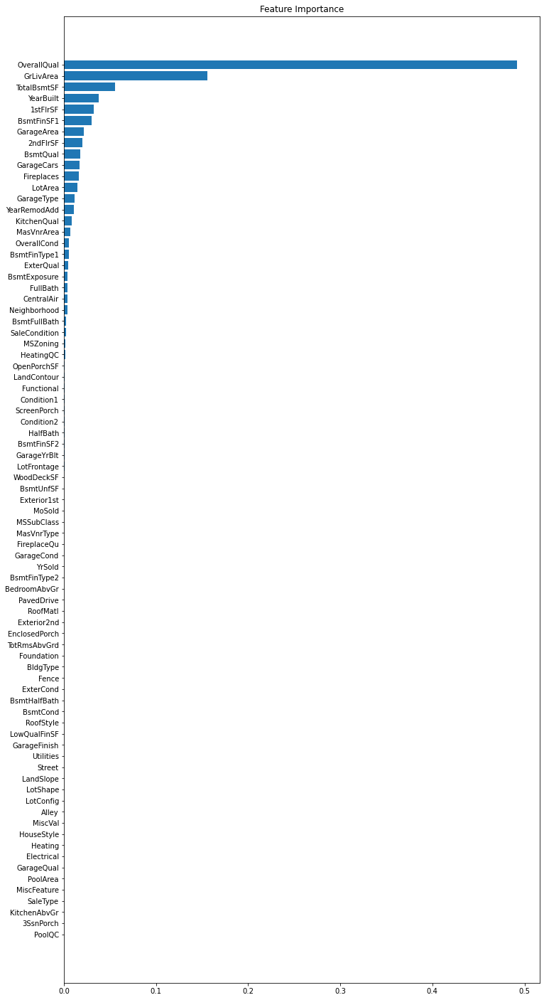

In [16]:
feature_importance = GB.feature_importances_
sorted_idx = np.argsort(feature_importance)

fig = plt.figure(figsize=(12, 25))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance');

In [17]:
X_cols = ordinal.drop(['SalePrice'], axis=1).columns
sorted_importance = sorted(zip(X_cols, GB.feature_importances_), key=lambda t:t[1], reverse=True)
sorted_importance

[('OverallQual', 0.4916287440897547),
 ('GrLivArea', 0.15613279787558362),
 ('TotalBsmtSF', 0.0556370120953256),
 ('YearBuilt', 0.03794158923391587),
 ('1stFlrSF', 0.032526588703430656),
 ('BsmtFinSF1', 0.030202192838512464),
 ('GarageArea', 0.021762386201269013),
 ('2ndFlrSF', 0.020225324639867634),
 ('BsmtQual', 0.017663699868233122),
 ('GarageCars', 0.01667675898425276),
 ('Fireplaces', 0.01599268157060019),
 ('LotArea', 0.014754669297487491),
 ('GarageType', 0.011974999847929865),
 ('YearRemodAdd', 0.010556420717417738),
 ('KitchenQual', 0.008873809290691093),
 ('MasVnrArea', 0.006871166977949394),
 ('OverallCond', 0.005643562686984584),
 ('BsmtFinType1', 0.005592786178841849),
 ('ExterQual', 0.004662399207177391),
 ('BsmtExposure', 0.003894556716901653),
 ('FullBath', 0.0038005637400227972),
 ('CentralAir', 0.003632632966464479),
 ('Neighborhood', 0.00355879241391864),
 ('BsmtFullBath', 0.0026262612841252246),
 ('SaleCondition', 0.0025492671177635754),
 ('MSZoning', 0.001818362423